In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.cluster import contingency_matrix

import os
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import display, HTML
os.makedirs("Graficos", exist_ok=True)

In [19]:
def preparar_ejes(ejes, patrones, titulo):
    margen = 0.15
    ejes.set_xlim(patrones[:, 0].min() - margen, patrones[:, 0].max() + margen)
    ejes.set_ylim(patrones[:, 1].min() - margen, patrones[:, 1].max() + margen)
    ejes.set_aspect("equal")
    ejes.grid(True, linestyle=":", alpha=0.35)
    ejes.set_axisbelow(True)
    ejes.set_xlabel("$x_1$")
    ejes.set_ylabel("$x_2$")
    ejes.set_title(titulo, fontsize=11)


def dibujar_malla(ejes, pesos, pares_de_vecinas, color="#1f6feb", grosor=1.0, alfa=0.9):
    for indice_a, indice_b in pares_de_vecinas:
        ejes.plot([pesos[indice_a, 0], pesos[indice_b, 0]],
                  [pesos[indice_a, 1], pesos[indice_b, 1]],
                  color=color, linewidth=grosor, alpha=alfa, zorder=2)


def graficar_resultados(mapa, patrones, titulo, ruta_de_salida=None):
    figura, (ejes_izquierda, ejes_derecha) = plt.subplots(1, 2, figsize=(12.5, 6.2))

    preparar_ejes(ejes_izquierda, patrones, "Mapa topologico")
    ejes_izquierda.scatter(patrones[:, 0], patrones[:, 1], s=9, color="#b9c0c8",
                           alpha=0.7, zorder=1, label="patrones")
    dibujar_malla(ejes_izquierda, mapa.pesos, mapa.aristas_de_la_malla())
    ejes_izquierda.scatter(mapa.pesos[:, 0], mapa.pesos[:, 1], s=26, color="#d1495b",
                           zorder=3, edgecolor="white", linewidth=0.6, label="neuronas (pesos)")
    ejes_izquierda.legend(loc="upper right", framealpha=0.9, fontsize=9)

    ganadoras = mapa.ganadoras_de_todos(patrones)
    preparar_ejes(ejes_derecha, patrones, "Neurona ganadora de cada patron")
    ejes_derecha.scatter(patrones[:, 0], patrones[:, 1], c=ganadoras, cmap="hsv",
                         s=14, alpha=0.85, zorder=1)
    dibujar_malla(ejes_derecha, mapa.pesos, mapa.aristas_de_la_malla(),
                  color="#2b3137", grosor=0.7, alfa=0.45)
    ejes_derecha.scatter(mapa.pesos[:, 0], mapa.pesos[:, 1], marker="X", s=70,
                         color="black", zorder=4, edgecolor="white", linewidth=0.8,
                         label="centroide de cada neurona")
    ejes_derecha.legend(loc="upper right", framealpha=0.9, fontsize=9)
    ejes_derecha.text(0.02, 0.98,
                      f"neuronas con al menos un patron: {len(np.unique(ganadoras))} de {mapa.cantidad_de_neuronas}",
                      transform=ejes_derecha.transAxes, va="top", fontsize=9,
                      bbox=dict(boxstyle="round,pad=0.35", facecolor="white",
                                alpha=0.85, edgecolor="#c8ccd2"))

    figura.suptitle(titulo, fontsize=12)
    figura.tight_layout()
    if ruta_de_salida is not None:
        figura.savefig(ruta_de_salida, dpi=150)
    plt.show()


def animar_entrenamiento(mapa, patrones, historial_de_pesos, historial_de_etiquetas,
                         titulo, milisegundos_por_cuadro=120):
    pares_de_vecinas = mapa.aristas_de_la_malla()
    figura, ejes = plt.subplots(figsize=(5.6, 5.9))

    def dibujar_cuadro(indice_de_cuadro):
        ejes.clear()
        preparar_ejes(ejes, patrones, f"{titulo}\n{historial_de_etiquetas[indice_de_cuadro]}")
        ejes.scatter(patrones[:, 0], patrones[:, 1], s=8, color="#ccd2d8", alpha=0.6, zorder=1)
        pesos = historial_de_pesos[indice_de_cuadro]
        dibujar_malla(ejes, pesos, pares_de_vecinas)
        ejes.scatter(pesos[:, 0], pesos[:, 1], s=22, color="#d1495b", zorder=3,
                     edgecolor="white", linewidth=0.5)

    animacion = FuncAnimation(figura, dibujar_cuadro, frames=len(historial_de_pesos),
                              interval=milisegundos_por_cuadro)
    plt.close(figura)
    return HTML(animacion.to_jshtml())
    
def cargar_patrones(ruta):
    patrones = np.loadtxt(ruta, delimiter=",")
    print(f"{ruta}: {patrones.shape[0]} patrones de {patrones.shape[1]} entradas")
    return patrones

## Ejercicio 1

Implemente el algoritmo de entrenamiento de un SOM bidimensional de forma que se pueda ver graficamente el mapa topologico durante todo el proceso. Para poder observar el ordenamiento topologico, en el mapa grafique lineas de union entre pares de neuronas vecinas. Realice las pruebas de ordenamiento topologico con los patrones provistos en los archivos `circulo.csv` y `te.csv`, usando un maximo de 1000 epocas de entrenamiento. Dichos datos fueron generados aleatoriamente con distribucion uniforme dentro de un circulo de radio 1 centrado en el origen y una T.

Para cada distribucion grafique los datos de entrenamiento coloreando cada punto segun la neurona ganadora correspondiente, y agregue el centroide de cada neurona con otro marcador.

Repita el entrenamiento con los datos en T pero para un SOM unidimensional con la misma cantidad de neuronas.

- Implementar el algoritmo de entrenamiento de un SOM bidimensional — propio, no minisom ni librería.
- Poder ver gráficamente el mapa topológico durante todo el proceso, no sólo el resultado final.
- Líneas de unión entre pares de neuronas vecinas dibujadas en el mapa.
- Prueba de ordenamiento con circulo.csv.
- Prueba de ordenamiento con te.csv.
- Máximo 1000 épocas de entrenamiento (en las dos).
- Para cada distribución: los datos coloreados según la neurona ganadora de cada punto.
- Para cada distribución: el centroide de cada neurona, con otro marcador distinto al de los datos.
- Repetir el entrenamiento con te.csv en un SOM unidimensional, con la misma cantidad de neuronas que el bidimensional (100).

In [20]:
class MapaAutorganizativo:
    
    def __init__(self, filas, columnas, cantidad_de_entradas, semilla=2077):
        self.filas = filas
        self.columnas = columnas
        self.cantidad_de_neuronas = filas * columnas
        self.cantidad_de_entradas = cantidad_de_entradas
        
        generador = np.random.default_rng(semilla)
        self.pesos = generador.uniform(low=-0.5, high=0.5,size=(self.cantidad_de_neuronas, cantidad_de_entradas),)
        
    def coordenadas_en_el_mapa(self, indice_de_neurona):
        fila = indice_de_neurona // self.columnas
        columna = indice_de_neurona % self.columnas
        return fila, columna
        
    def neurona_ganadora(self,patron):
        diferencias = self.pesos - patron
        distancias_al_cuadrado = np.sum(diferencias ** 2, axis=1)
        indice_de_la_ganadora = np.argmin(distancias_al_cuadrado)
        return int(indice_de_la_ganadora)
    
    def neuronas_del_entorno(self, indice_de_la_ganadora, radio):
        fila_ganadora, columna_ganadora = self.coordenadas_en_el_mapa(indice_de_la_ganadora)
        indices_del_entorno = []

        for indice_de_neurona in range(self.cantidad_de_neuronas):
            fila, columna = self.coordenadas_en_el_mapa(indice_de_neurona)

            distancia_en_filas = abs(fila - fila_ganadora)
            distancia_en_columnas = abs(columna - columna_ganadora)
            distancia_en_el_mapa = max(distancia_en_filas, distancia_en_columnas)

            if distancia_en_el_mapa <= radio:
                indices_del_entorno.append(indice_de_neurona)

        return indices_del_entorno
    
    def adaptar(self, patron, indices_del_entorno, velocidad_de_aprendizaje):
        for indice_de_neurona in indices_del_entorno:
            peso_actual = self.pesos[indice_de_neurona]
            desplazamiento = velocidad_de_aprendizaje * (patron - peso_actual)
            self.pesos[indice_de_neurona] = peso_actual + desplazamiento
            

    def parametros_de_la_epoca(self, epoca, epocas_totales):
        radio_inicial = max(self.filas, self.columnas) // 2
        avance = epoca / epocas_totales

        if avance < 0.20:
            proporcion_de_la_etapa = avance / 0.20
            velocidad_de_aprendizaje = 0.9 - proporcion_de_la_etapa * (0.9 - 0.7)
            radio = radio_inicial
            nombre_de_la_etapa = "ordenamiento"

        elif avance < 0.40:
            proporcion_de_la_etapa = (avance - 0.20) / 0.20
            velocidad_de_aprendizaje = 0.7 - proporcion_de_la_etapa * (0.7 - 0.1)
            tramo = int(proporcion_de_la_etapa * radio_inicial)
            radio = max(1, radio_inicial - tramo)
            nombre_de_la_etapa = "transicion"

        else:
            velocidad_de_aprendizaje = 0.01
            radio = 0
            nombre_de_la_etapa = "ajuste fino"

        return velocidad_de_aprendizaje, radio, nombre_de_la_etapa
    
    def entrenar(self, patrones, epocas_totales=1000, epocas_entre_cuadros=10, semilla_del_orden=2077):
        generador = np.random.default_rng(semilla_del_orden)
        historial_de_pesos = []
        historial_de_etiquetas = []

        for epoca in range(epocas_totales):
            velocidad_de_aprendizaje, radio, nombre_de_la_etapa = self.parametros_de_la_epoca(epoca, epocas_totales)

            if epoca % epocas_entre_cuadros == 0:
                historial_de_pesos.append(self.pesos.copy())
                historial_de_etiquetas.append(
                    f"epoca {epoca} | {nombre_de_la_etapa} | radio {radio} | eta {velocidad_de_aprendizaje:.3f}"
                )

            orden_de_los_patrones = generador.permutation(len(patrones))

            for indice_de_patron in orden_de_los_patrones:
                patron = patrones[indice_de_patron]

                indice_de_la_ganadora = self.neurona_ganadora(patron)
                indices_del_entorno = self.neuronas_del_entorno(indice_de_la_ganadora, radio)
                self.adaptar(patron, indices_del_entorno, velocidad_de_aprendizaje)

        historial_de_pesos.append(self.pesos.copy())
        historial_de_etiquetas.append(f"epoca {epocas_totales} | final")

        return historial_de_pesos, historial_de_etiquetas

    def aristas_de_la_malla(self):
        pares_de_vecinas = []
        for indice_de_neurona in range(self.cantidad_de_neuronas):
            fila, columna = self.coordenadas_en_el_mapa(indice_de_neurona)
            if columna < self.columnas - 1:
                pares_de_vecinas.append((indice_de_neurona, indice_de_neurona + 1))
            if fila < self.filas - 1:
                pares_de_vecinas.append((indice_de_neurona, indice_de_neurona + self.columnas))
        return pares_de_vecinas

    def ganadoras_de_todos(self, patrones):
        return np.array([self.neurona_ganadora(patron) for patron in patrones])

Dataset/circulo.csv: 750 patrones de 2 entradas


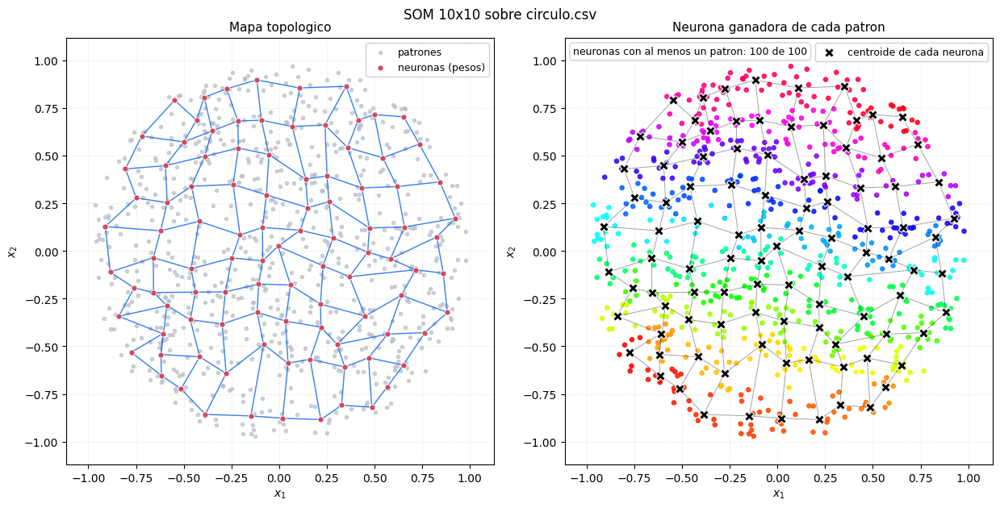

In [21]:
patrones_circulo = cargar_patrones("Dataset/circulo.csv")

mapa_circulo = MapaAutorganizativo(filas=10, columnas=10, cantidad_de_entradas=patrones_circulo.shape[1], semilla=2077)

historial_circulo, etiquetas_circulo = mapa_circulo.entrenar(patrones_circulo, epocas_totales=1000, epocas_entre_cuadros=20)

titulo_circulo = f"SOM {mapa_circulo.filas}x{mapa_circulo.columnas} sobre circulo.csv"

graficar_resultados(mapa_circulo, patrones_circulo, titulo_circulo, "Graficos/circulo_resultados.png")

animar_entrenamiento(mapa_circulo, patrones_circulo, historial_circulo, etiquetas_circulo, titulo_circulo)

Dataset/te.csv: 800 patrones de 2 entradas


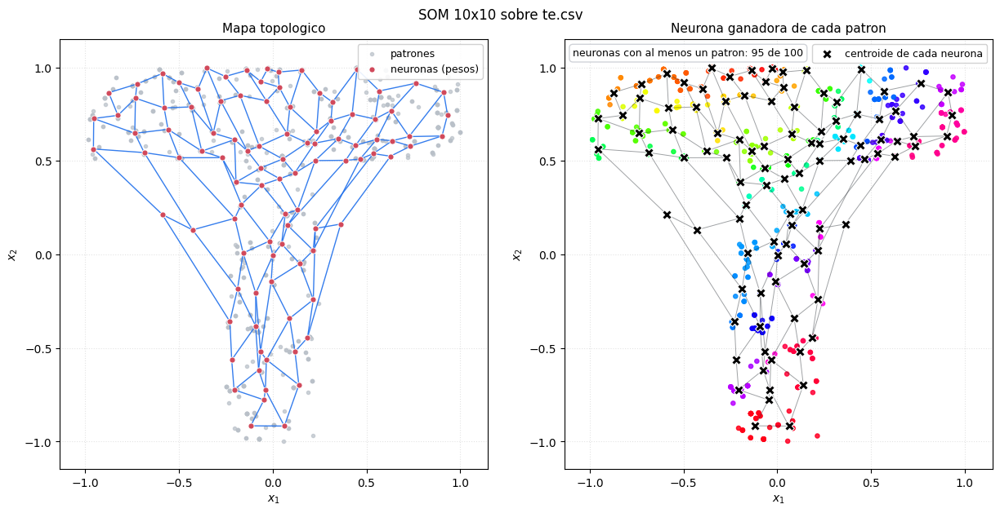

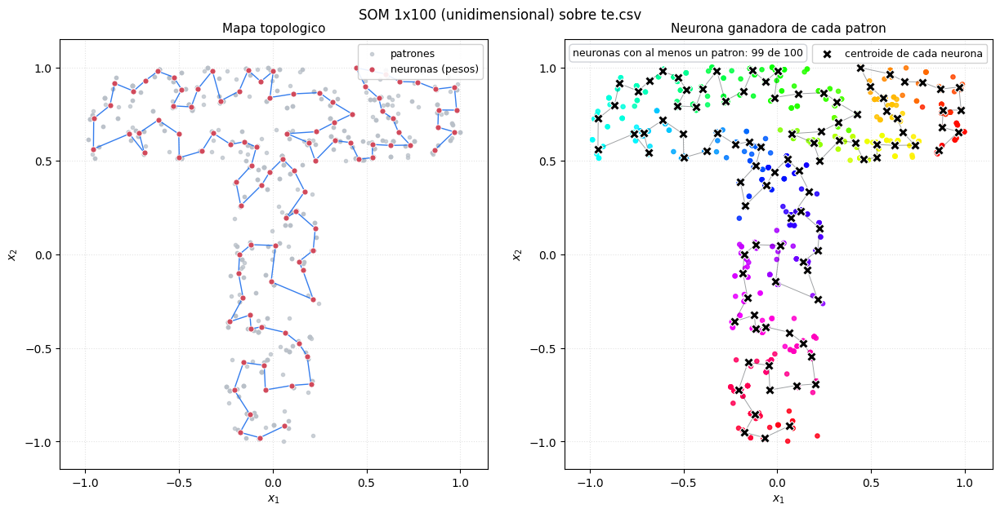

In [29]:
patrones_te = cargar_patrones("Dataset/te.csv")

mapa_te = MapaAutorganizativo(filas=10, columnas=10, cantidad_de_entradas=patrones_te.shape[1], semilla=2077)

historial_te, etiquetas_te = mapa_te.entrenar(patrones_te, epocas_totales=1000, epocas_entre_cuadros=20)

titulo_te = f"SOM {mapa_te.filas}x{mapa_te.columnas} sobre te.csv"

graficar_resultados(mapa_te, patrones_te, titulo_te, "Graficos/te_resultados.png")
display(animar_entrenamiento(mapa_te, patrones_te, historial_te, etiquetas_te, titulo_te))


mapa_te_unidimensional = MapaAutorganizativo(filas=1, columnas=100, cantidad_de_entradas=patrones_te.shape[1], semilla=2077)

historial_te_1d, etiquetas_te_1d = mapa_te_unidimensional.entrenar(patrones_te, epocas_totales=1000, epocas_entre_cuadros=20)

titulo_te_1d = f"SOM 1x{mapa_te_unidimensional.columnas} (unidimensional) sobre te.csv"

graficar_resultados(mapa_te_unidimensional, patrones_te, titulo_te_1d, "Graficos/te_1d_resultados.png")
display(animar_entrenamiento(mapa_te_unidimensional, patrones_te, historial_te_1d, etiquetas_te_1d, titulo_te_1d))

## Ejercicio 2

Implemente el metodo de clustering k-medias sobre el conjunto de datos Iris (GTP2) y compare las soluciones obtenidas con las de un SOM. Para esto obtenga las matrices de contingencia entre ambos metodos y entre cada metodo y las clases de referencia.

Seleccione 2 dimensiones y grafique los datos coloreando cada punto segun el grupo al que pertenece en la solucion de k-medias y en la del SOM.

Grafique las neuronas del SOM en 2D con una escala de colores segun las frecuencias de activacion para los datos de Iris. Indique ademas cual es la clase de Iris que representa cada neurona.

In [22]:
# Carga del dataset Iris y clustering con k-medias

In [23]:
# Entrenamiento del SOM sobre Iris

In [24]:
# Matrices de contingencia: k-medias vs SOM vs clases de referencia

In [25]:
# Grafico de los datos en 2D coloreados segun k-medias y segun el SOM

In [26]:
# Mapa del SOM en 2D con frecuencias de activacion y clase asociada a cada neurona

## Ejercicio 3

Pruebe varios valores de k (por ejemplo entre 2 y 10) para el conjunto de datos Iris, calcule para cada k una metrica de clustering (con scikit-learn) y encuentre el k optimo para k-medias.

In [27]:
# Entrenamiento de k-medias para distintos valores de k y calculo de la metrica de clustering

In [28]:
# Grafico de la metrica en funcion de k y seleccion del k optimo